# Running BESS for an ECOSTRESS Scene

This is an example of running the artificial neural network emulator of the Breathing Earth Systems Simulator (BESS) corresponding to an ECOsystem Spaceborne Thermal Radiometer Experiment on Space Station (ECOSTRESS) scene.

In [ ]:
from os.path import join
from datetime import datetime, date, time
from dateutil import parser
import rasters as rt
from GEOS5FP import GEOS5FP
from koppengeiger import load_koppen_geiger
from solar_apparent_time import UTC_to_solar
import sun_angles
from gedi_canopy_height import GEDICanopyHeight
from MODISCI import MODISCI
from FLiESANN import FLiESANN
from BESS_JPL import load_NDVI_minimum
from BESS_JPL import load_NDVI_maximum
from BESS_JPL import load_C4_fraction
from BESS_JPL import process_BESS_latlon
from BESS_JPL import load_carbon_uptake_efficiency
from BESS_JPL import load_kn
from BESS_JPL import load_peakVCmax_C3
from BESS_JPL import load_peakVCmax_C4
from BESS_JPL import load_ball_berry_intercept_C3
from BESS_JPL import load_ball_berry_slope_C3
from BESS_JPL import load_ball_berry_slope_C4
from BESS_JPL import BALL_BERRY_INTERCEPT_C4
from matplotlib.colors import LinearSegmentedColormap
import logging
logging.disable(logging.CRITICAL)

/opt/homebrew/Caskroom/miniforge/base/envs/breathing-earth-system-simulator/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Here's an example ECOSTRESS surface temperature scene.

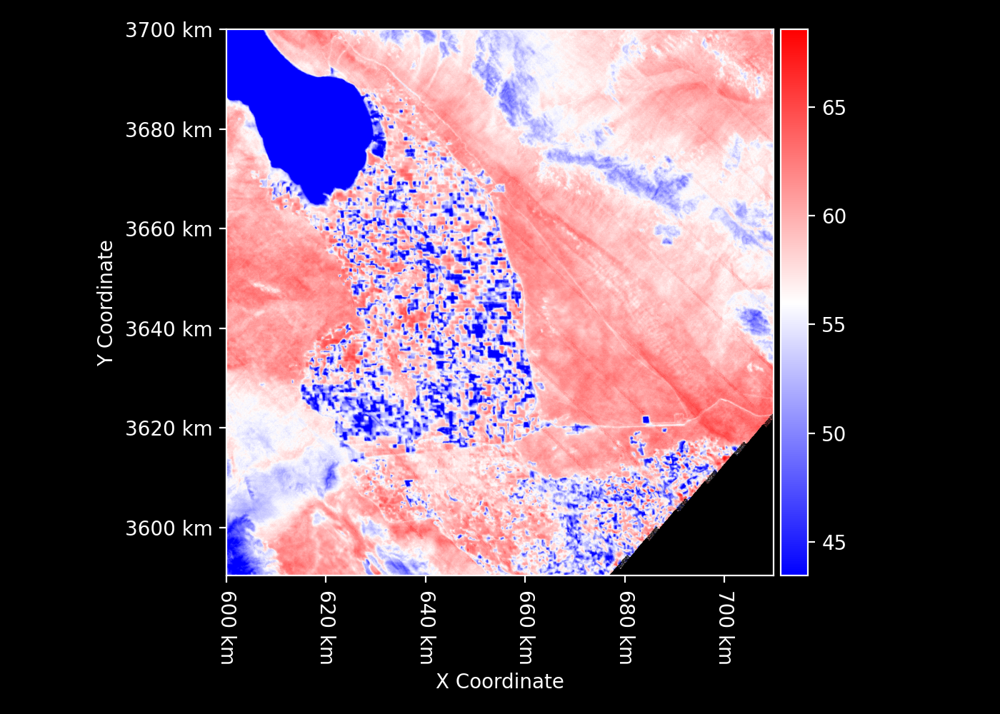

In [2]:
ST_filename = "ECOv002_L2T_LSTE_34366_004_11SPS_20240728T204025_0712_01_LST.tif"
ST_cmap = "bwr"
ST_C = rt.Raster.open(ST_filename, cmap=ST_cmap) - 273.15
ST_C

Let's get the acquisition time of the scene.

In [3]:
time_UTC = parser.parse(ST_filename.split("_")[6])
longitude = ST_C.geometry.centroid_latlon.x
latitude = ST_C.geometry.centroid_latlon.y
time_solar = UTC_to_solar(time_UTC, longitude)
doy_solar = time_solar.timetuple().tm_yday
hour_of_day_solar = time_solar.hour + time_solar.minute / 60 + time_solar.second / 3600
print(f"{time_UTC:%Y-%m-%d %H:%M:%S} UTC")
print(f"{time_solar:%Y-%m-%d %H:%M:%S} solar apparent time at longitude {longitude}")
print(f"day of year {doy_solar} at longitude {longitude}")
print(f"hour of day {hour_of_day_solar} at longitude {longitude}")

2024-07-28 20:40:25 UTC
2024-07-28 12:59:02 solar apparent time at longitude -115.3433725031462
day of year 210 at longitude -115.3433725031462
hour of day 12.983888888888888 at longitude -115.3433725031462


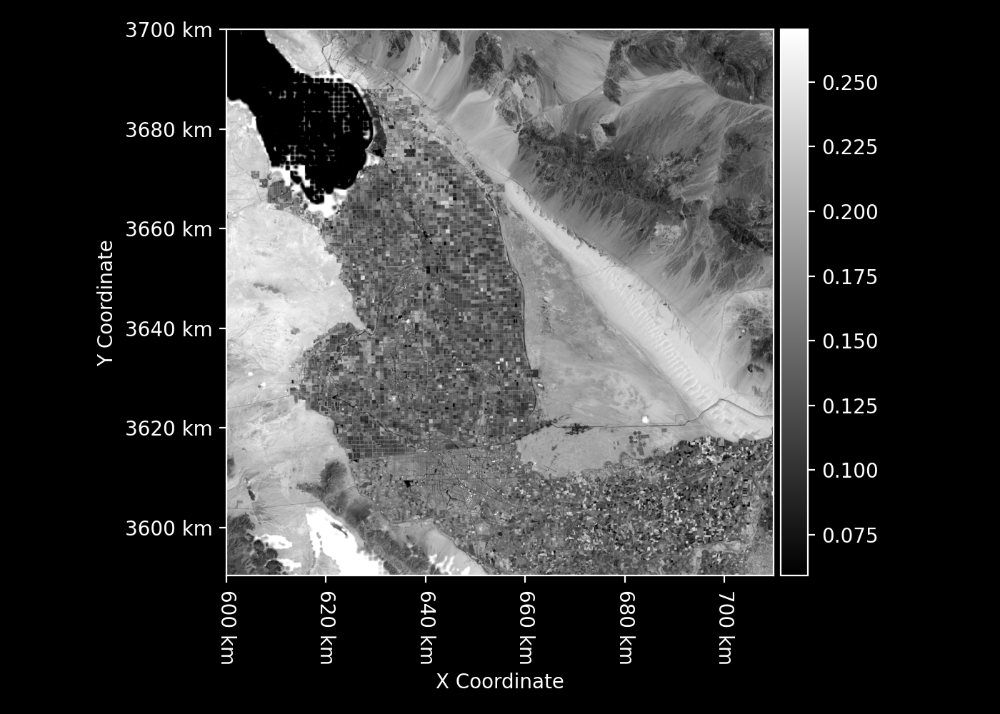

In [4]:
albedo_filename = "ECOv002_L2T_STARS_11SPS_20240728_0712_01_albedo.tif"
albedo_cmap = LinearSegmentedColormap.from_list(name="albedo", colors=["black", "white"])
albedo = rt.Raster.open(albedo_filename, cmap=albedo_cmap)
albedo

We'll use the `GEOS5FP` package to generate rasters of aerosol optical thickness (AOT) and cloud optical thickness (COT).

In [5]:
geos5fp = GEOS5FP(working_directory=join("~", "data", "GEOS5FP"))

Download AOT from GEOS-5 FP.

In [6]:
%%capture
AOT = geos5fp.AOT(time_UTC=time_UTC, geometry=ST_C.geometry)

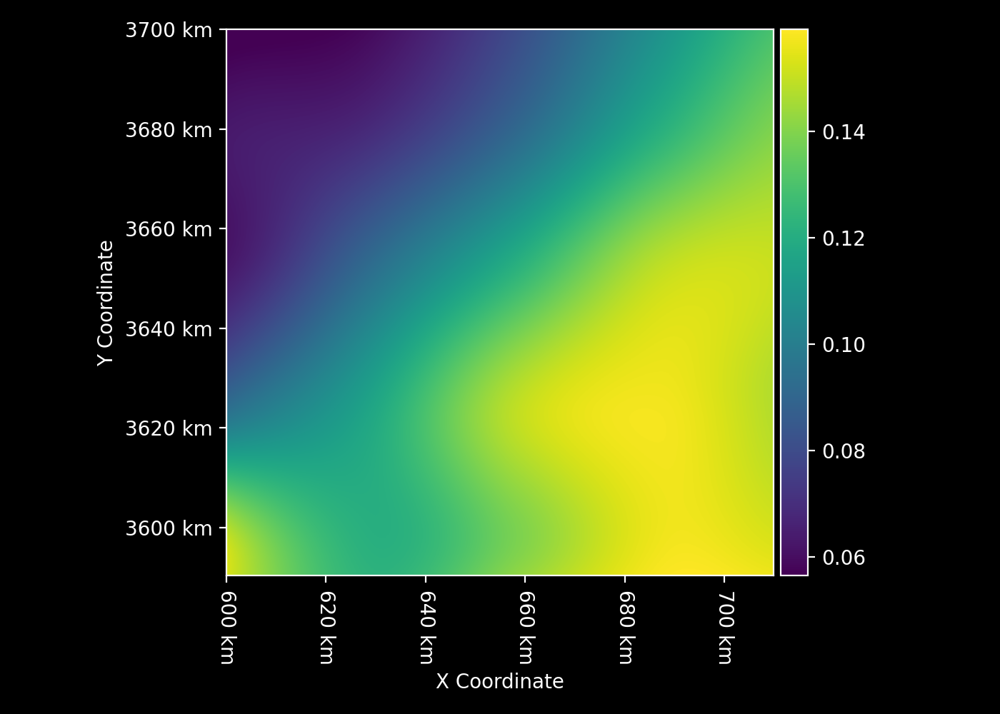

In [7]:
AOT.cmap = "viridis"
AOT

Download COT from GEOS-5 FP.

In [8]:
%%capture
COT = geos5fp.COT(time_UTC=time_UTC, geometry=ST_C.geometry)

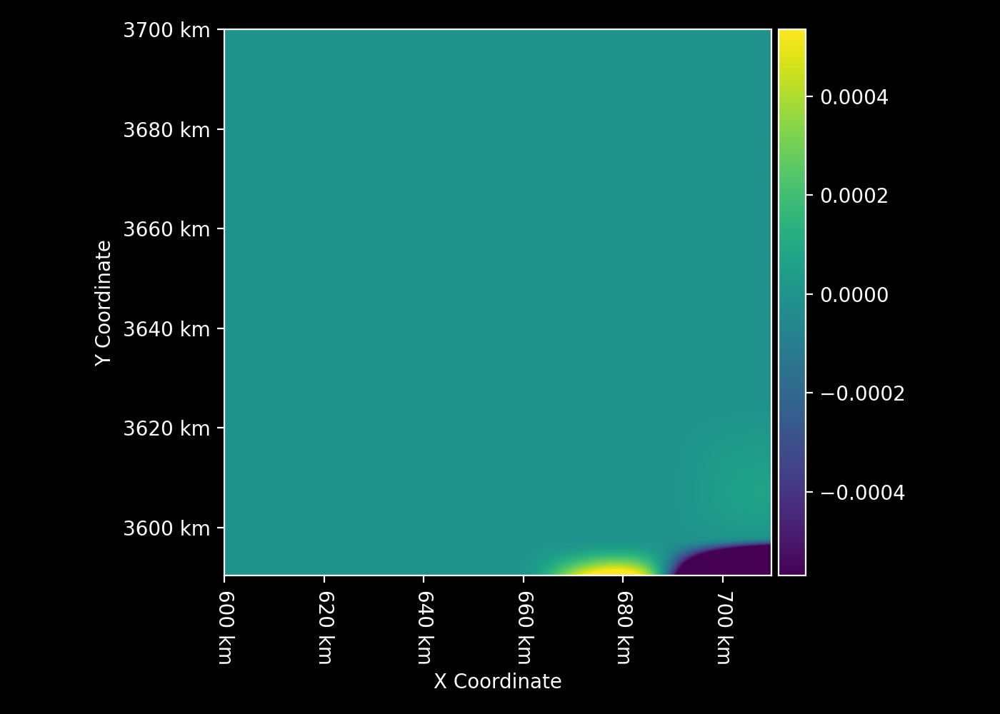

In [9]:
COT.cmap = "viridis"
COT

Download total column water vapor (vapor_gccm) in grams per square centimeter from GEOS-5 FP.

In [10]:
%%capture
vapor_gccm = geos5fp.vapor_gccm(time_UTC=time_UTC, geometry=ST_C.geometry)

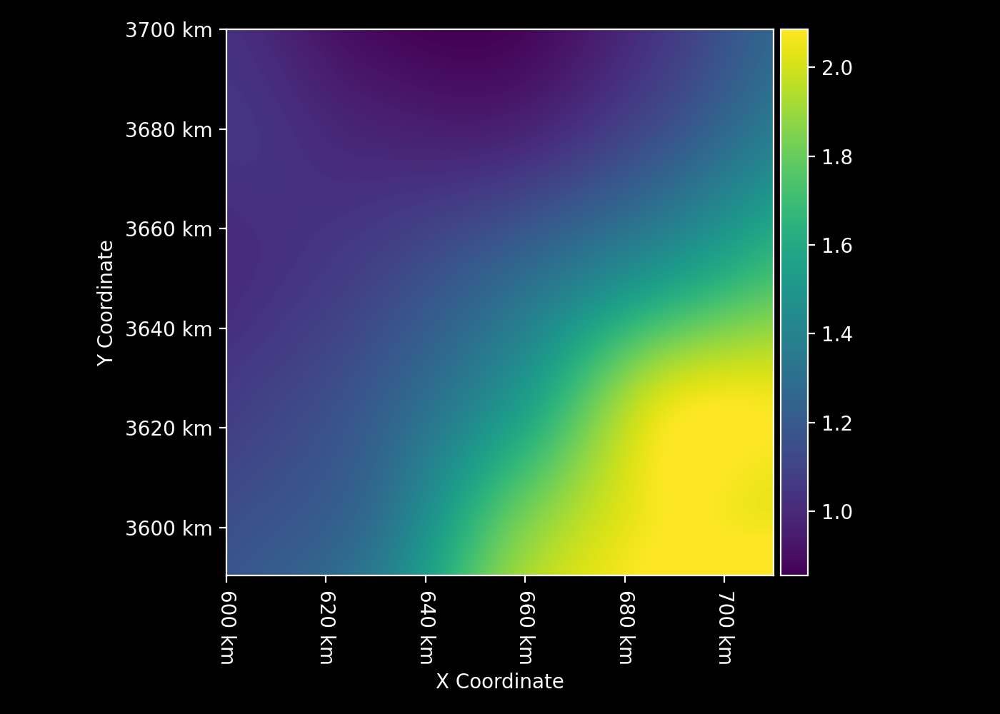

In [11]:
vapor_gccm.cmap = "viridis"
vapor_gccm

Download total column ozone (ozone_cm) in centimeters from GEOS-5 FP.

In [12]:
%%capture
ozone_cm = geos5fp.ozone_cm(time_UTC=time_UTC, geometry=ST_C.geometry)

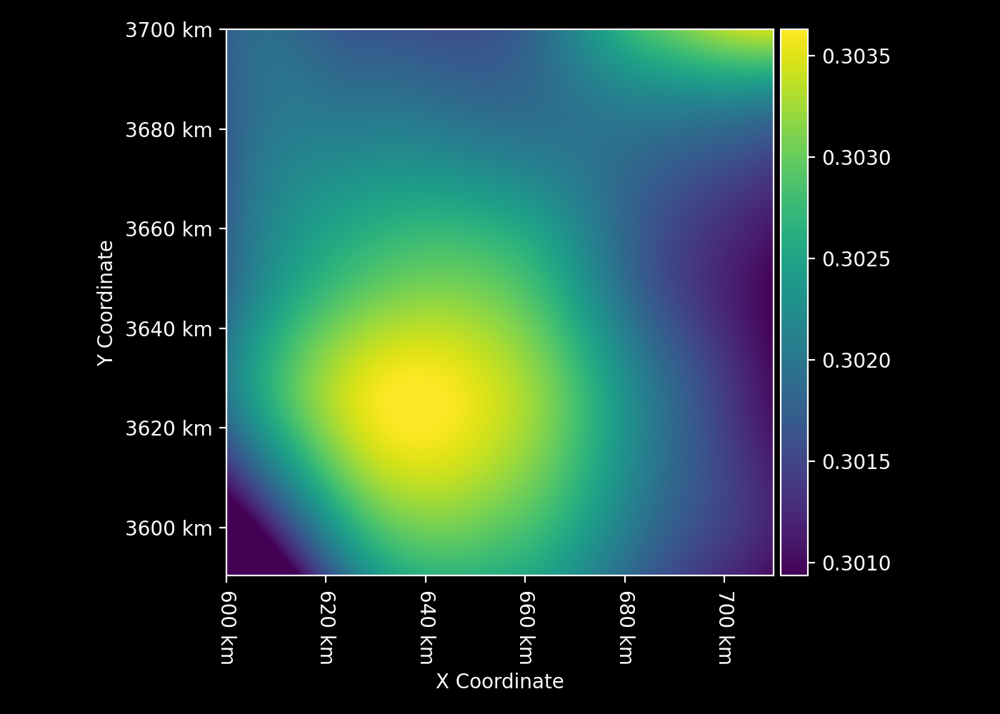

In [13]:
ozone_cm.cmap = "viridis"
ozone_cm

Load the Köppen–Geiger climate classification from the `koppengeiger` package.

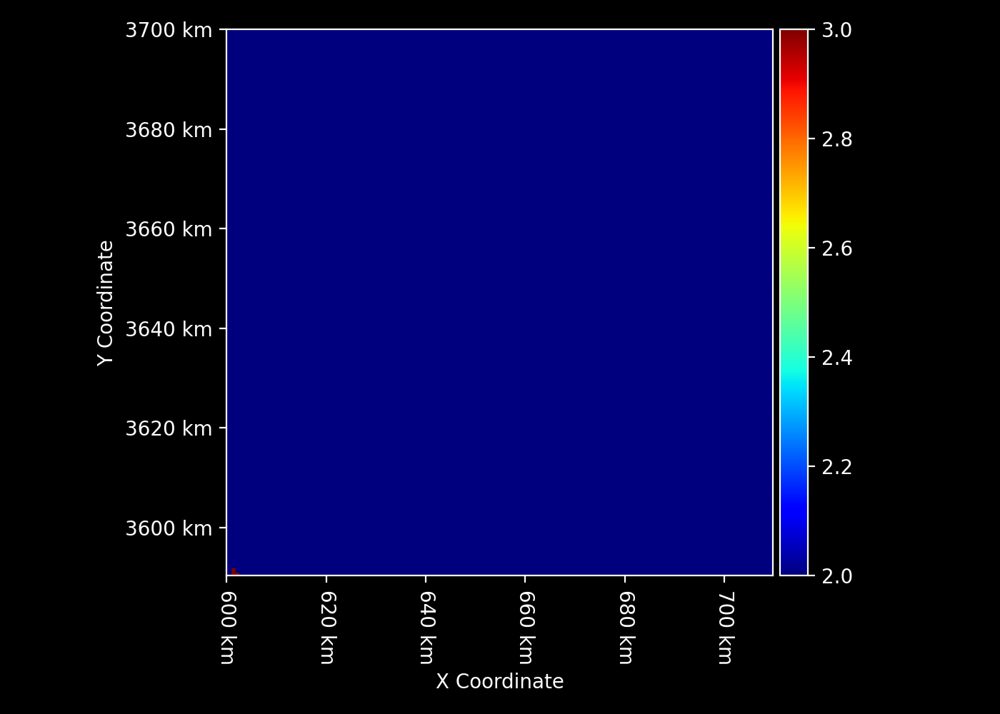

In [14]:
kg = load_koppen_geiger(ST_C.geometry)
kg

We'll use the digital elevation model (DEM) provided by ECOSTRESS, which is derived from the Shuttle Radar Topography Mission (SRTM).

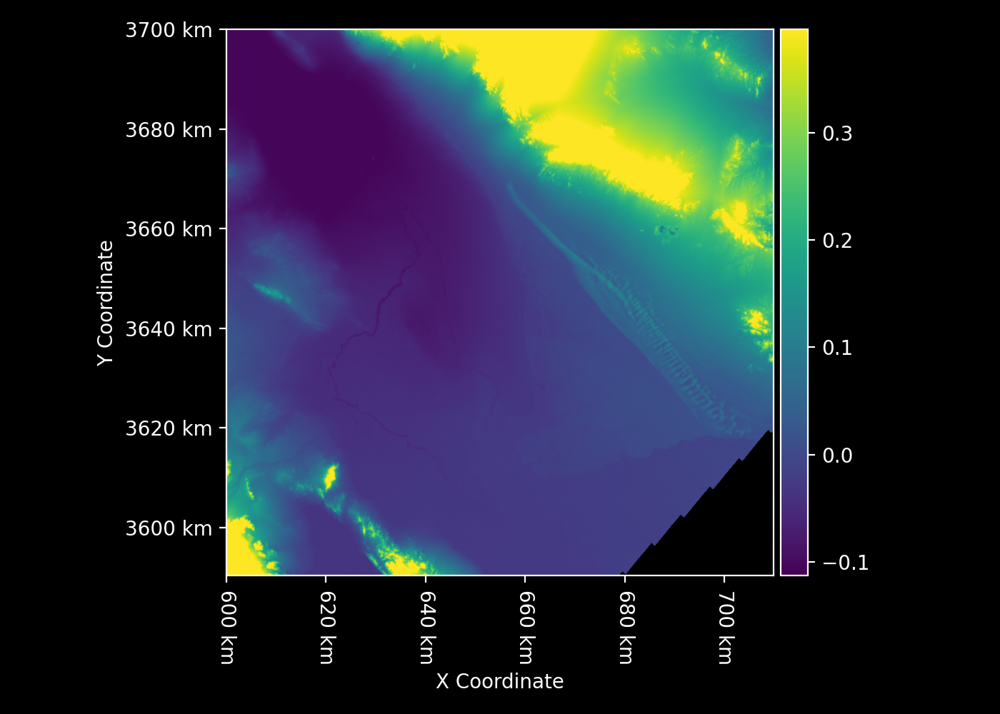

In [15]:
elevation_filename = "ECOv002_L2T_LSTE_34366_004_11SPS_20240728T204025_0712_01_height.tif"
elevation_m = rt.Raster.open(elevation_filename)
elevation_km = elevation_m / 1000
elevation_km.cmap = "viridis"
elevation_km

In [16]:
day_angle_rad = sun_angles.day_angle_rad_from_DOY(doy_solar)
solar_dec_deg = sun_angles.solar_dec_deg_from_day_angle_rad(day_angle_rad)
SZA_deg = sun_angles.SZA_deg_from_lat_dec_hour(ST_C.geometry.lat, solar_dec_deg, hour_of_day_solar)
SZA_deg

array([[19.58331727, 19.58331273, 19.58330818, ..., 19.57232504,
        19.57231554, 19.57230603],
       [19.58287844, 19.5828739 , 19.58286935, ..., 19.57188673,
        19.57187722, 19.57186772],
       [19.58243962, 19.58243508, 19.58243053, ..., 19.57144842,
        19.57143892, 19.57142941],
       ...,
       [18.90930225, 18.90929804, 18.90929382, ..., 18.89911795,
        18.89910914, 18.89910033],
       [18.90888002, 18.90887581, 18.9088716 , ..., 18.89869624,
        18.89868743, 18.89867863],
       [18.90845781, 18.9084536 , 18.90844938, ..., 18.89827454,
        18.89826574, 18.89825693]])

In [ ]:
FLiES_results = FLiESANN(
    doy=doy_solar,
    albedo=albedo,
    COT=COT,
    AOT=AOT,
    vapor_gccm=vapor_gccm,
    ozone_cm=ozone_cm,
    elevation_km=elevation_km,
    SZA=SZA_deg,
    KG_climate=kg
)

76832/76832 [==============================] - 18s 230us/step


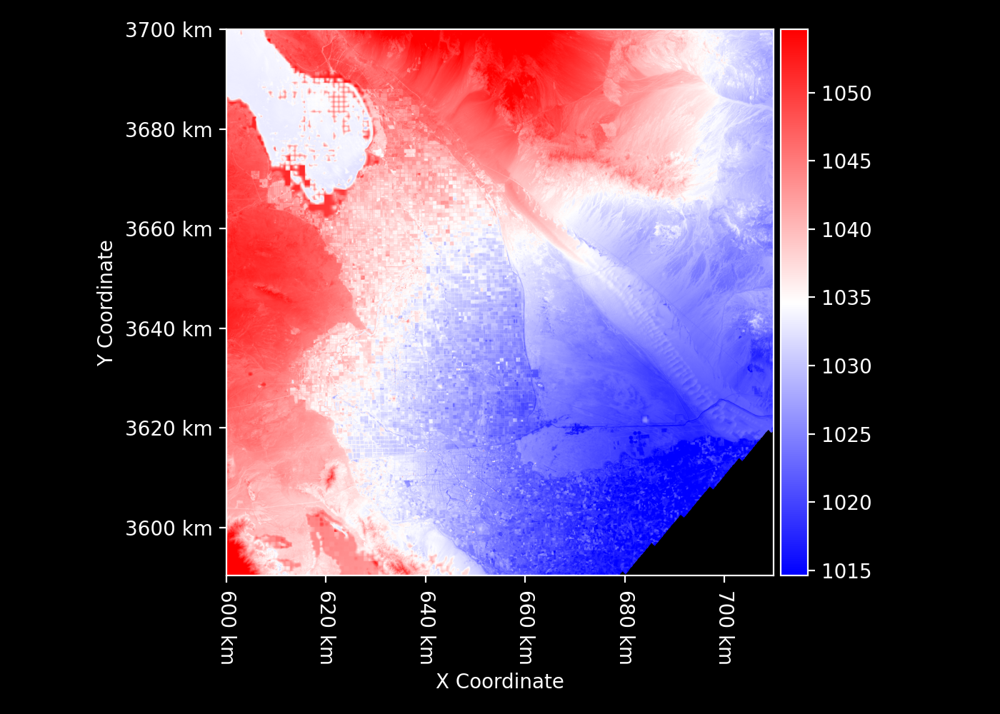

In [18]:
Rg = FLiES_results["Rg"]
Rg.cmap = "bwr"
Rg

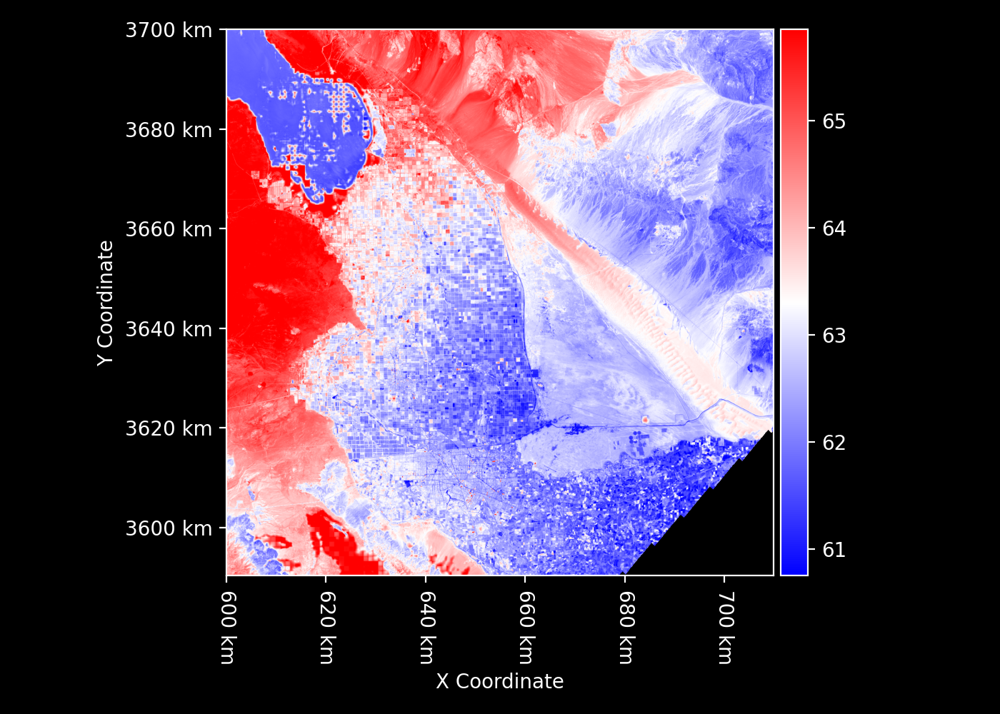

In [19]:
UV = FLiES_results["UV"]
UV.cmap = "bwr"
UV

In [20]:
VISdiff = FLiES_results["VISdiff"]
VISdir = FLiES_results["VISdir"]
NIRdiff = FLiES_results["NIRdiff"]
NIRdir = FLiES_results["NIRdir"]

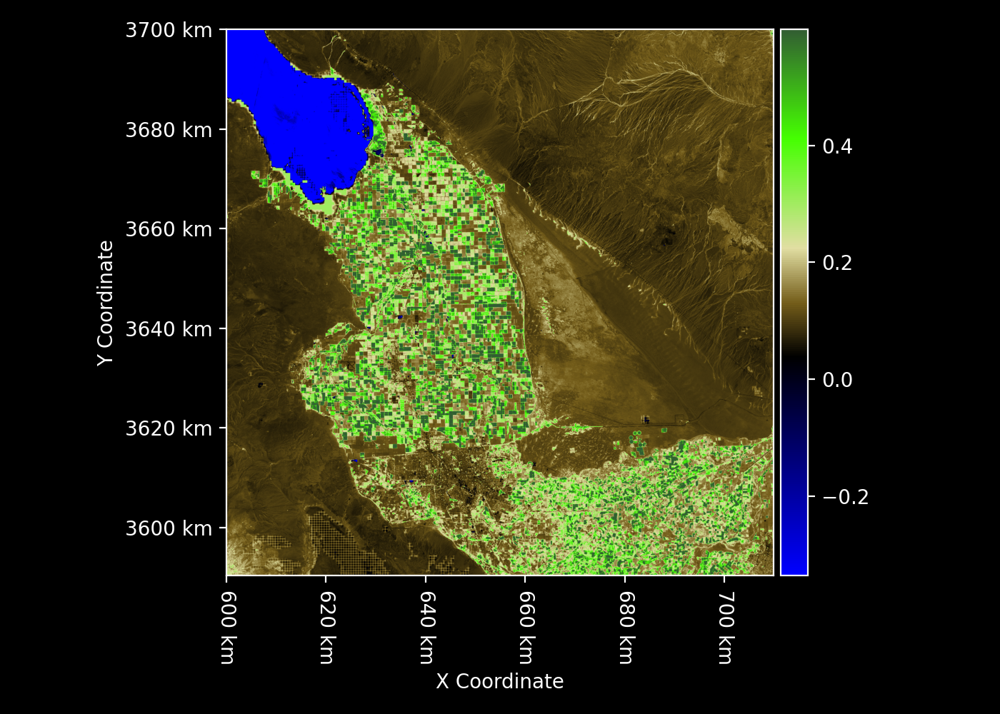

In [21]:
NDVI_filename = "ECOv002_L2T_STARS_11SPS_20240728_0712_01_NDVI.tif"
NDVI = rt. Raster.open(NDVI_filename)

NDVI_COLORMAP_ABSOLUTE = LinearSegmentedColormap.from_list(
    name="NDVI",
    colors=[
        (0, "#0000ff"),
        (0.4, "#000000"),
        (0.5, "#745d1a"),
        (0.6, "#e1dea2"),
        (0.8, "#45ff01"),
        (1, "#325e32")
    ]
)

NDVI.cmap = NDVI_COLORMAP_ABSOLUTE
NDVI

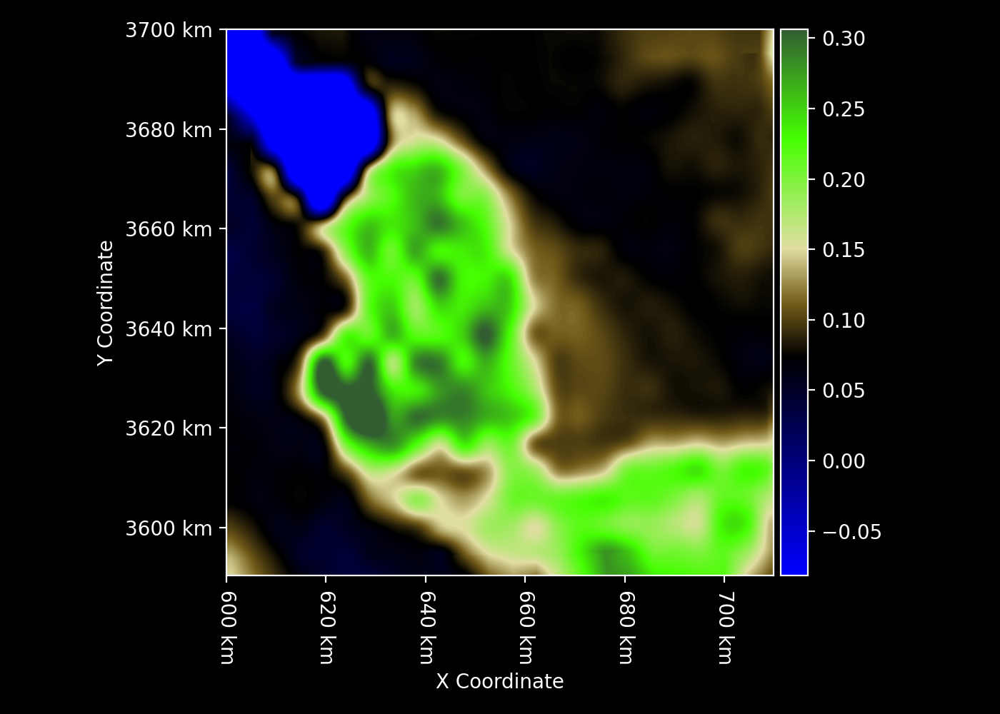

In [22]:
NDVI_minimum = load_NDVI_minimum(geometry=ST_C.geometry, resampling="cubic")
NDVI_minimum.cmap = NDVI_COLORMAP_ABSOLUTE
NDVI_minimum

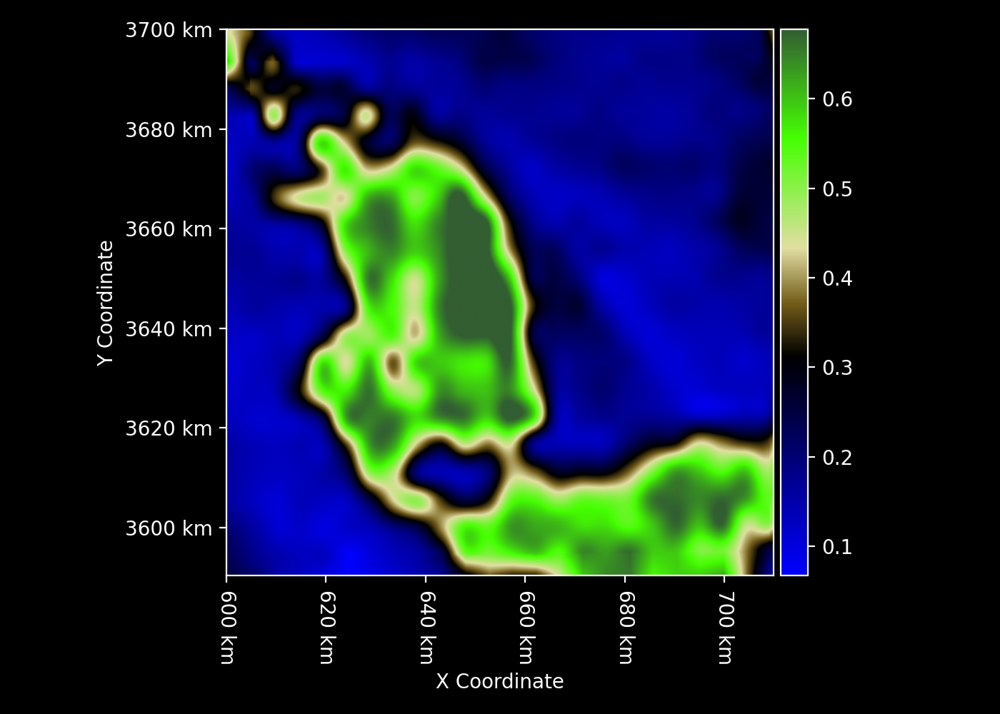

In [23]:
NDVI_maximum = load_NDVI_maximum(geometry=ST_C.geometry, resampling="cubic")
NDVI_maximum.cmap = NDVI_COLORMAP_ABSOLUTE
NDVI_maximum

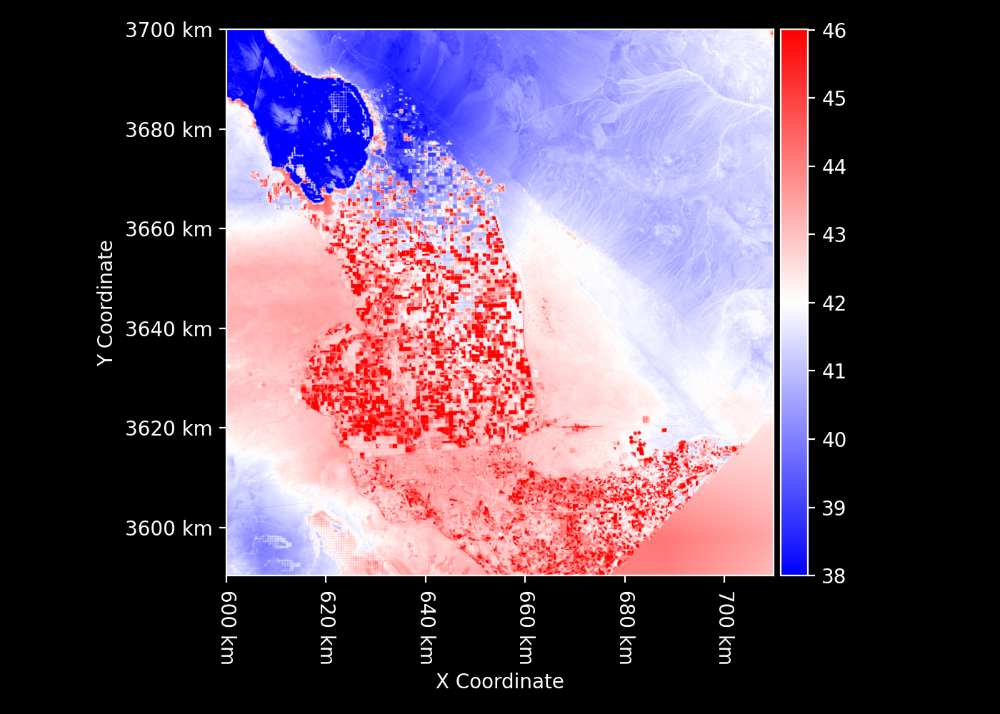

In [24]:
Ta_filename = "ECOv002_L3T_MET_34366_004_11SPS_20240728T204025_0712_01_Ta.tif"
Ta_C = rt.Raster.open(Ta_filename)
Ta_C.cmap = "bwr"
Ta_C

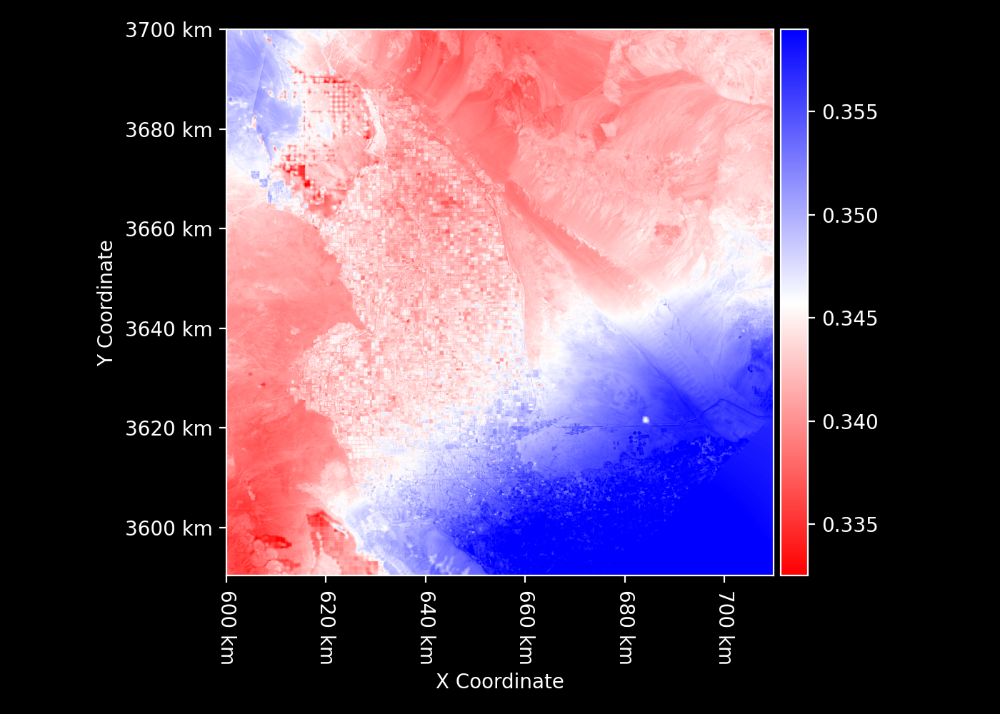

In [25]:
RH_filename = "ECOv002_L3T_MET_34366_004_11SPS_20240728T204025_0712_01_RH.tif"
RH = rt.Raster.open(RH_filename)
RH.cmap = "bwr_r"
RH

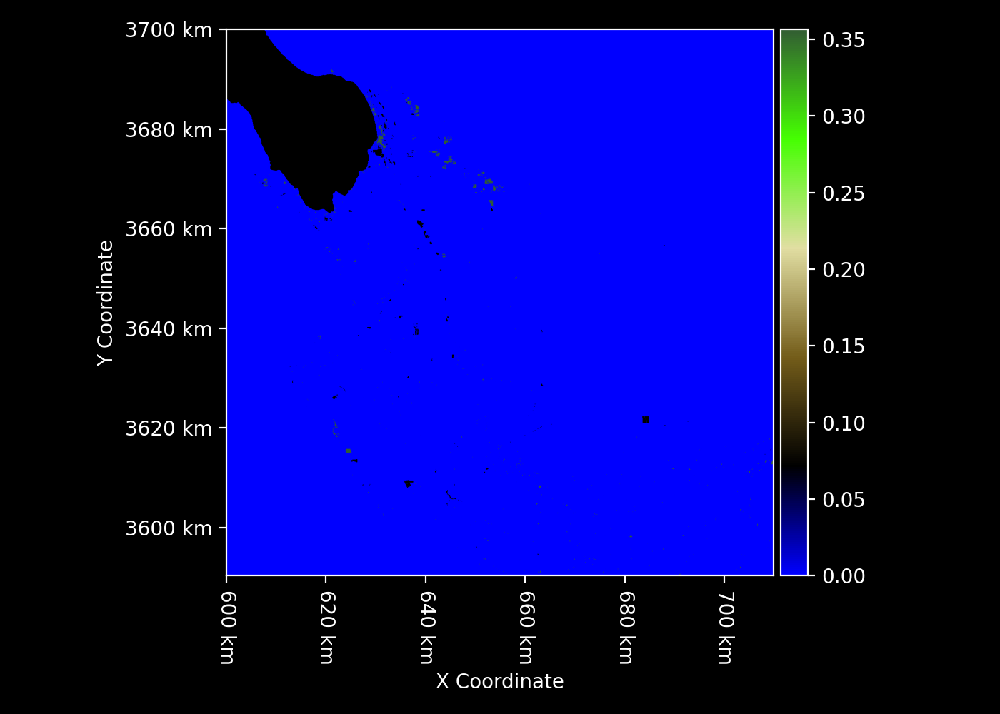

In [26]:
gedi_canopy_height = GEDICanopyHeight("~/data/JET_static/GEDI_download")
canopy_height_meters = gedi_canopy_height.canopy_height_meters(geometry=ST_C.geometry)
canopy_height_meters

In [27]:
%%capture
wind_speed_mps = geos5fp.wind_speed(time_UTC=time_UTC, geometry=ST_C.geometry)

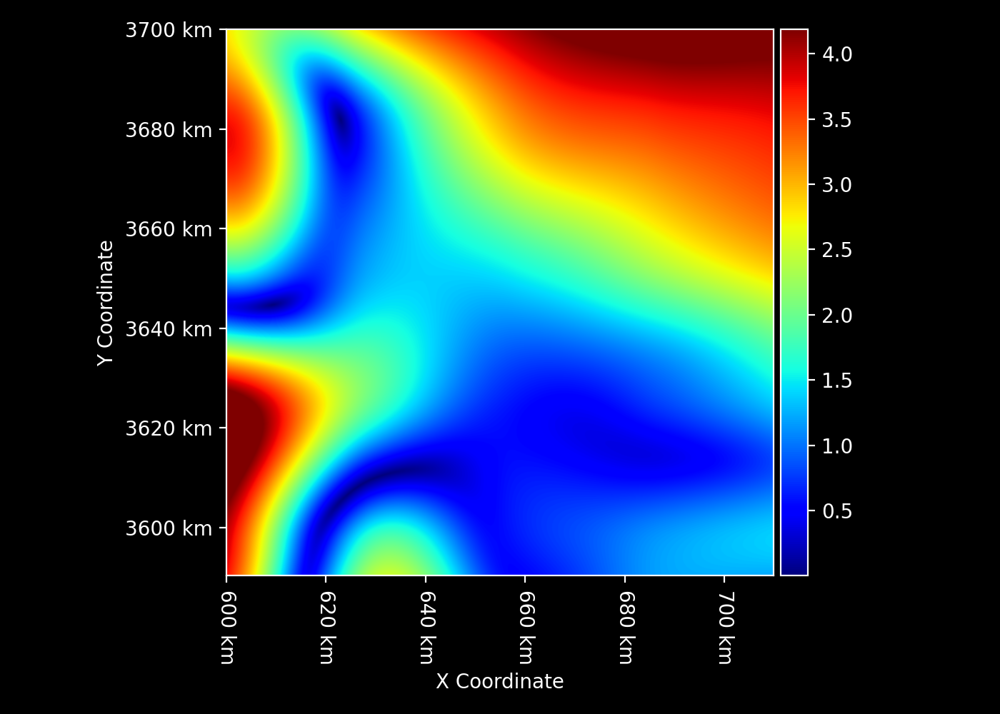

In [28]:
wind_speed_mps

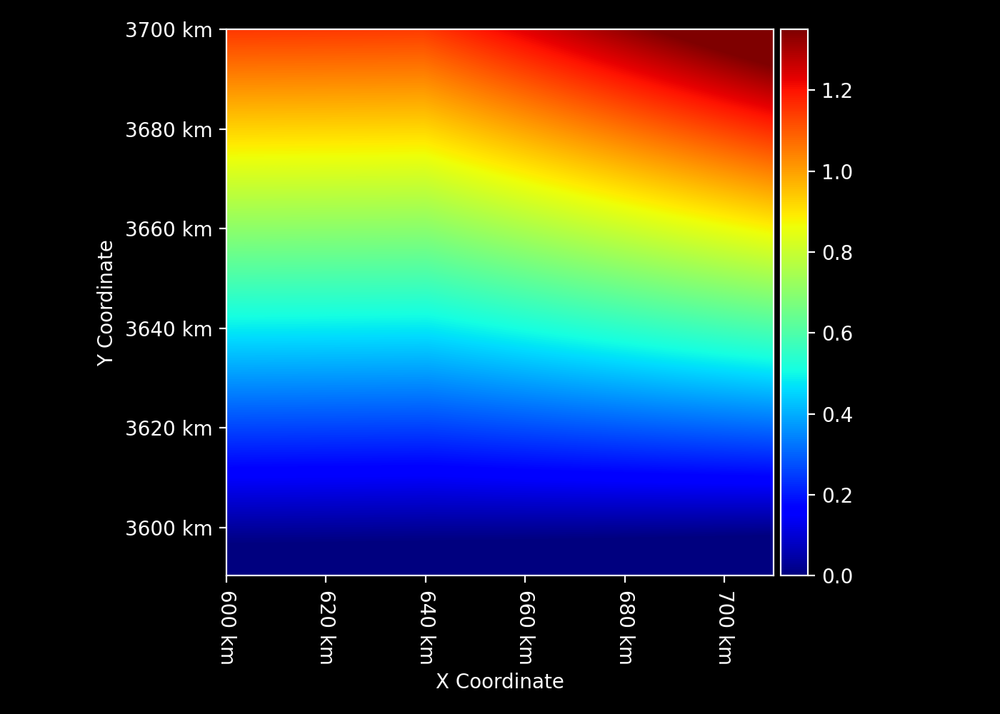

In [42]:
C4_fraction = load_C4_fraction(ST_C.geometry, resampling="cubic")
C4_fraction

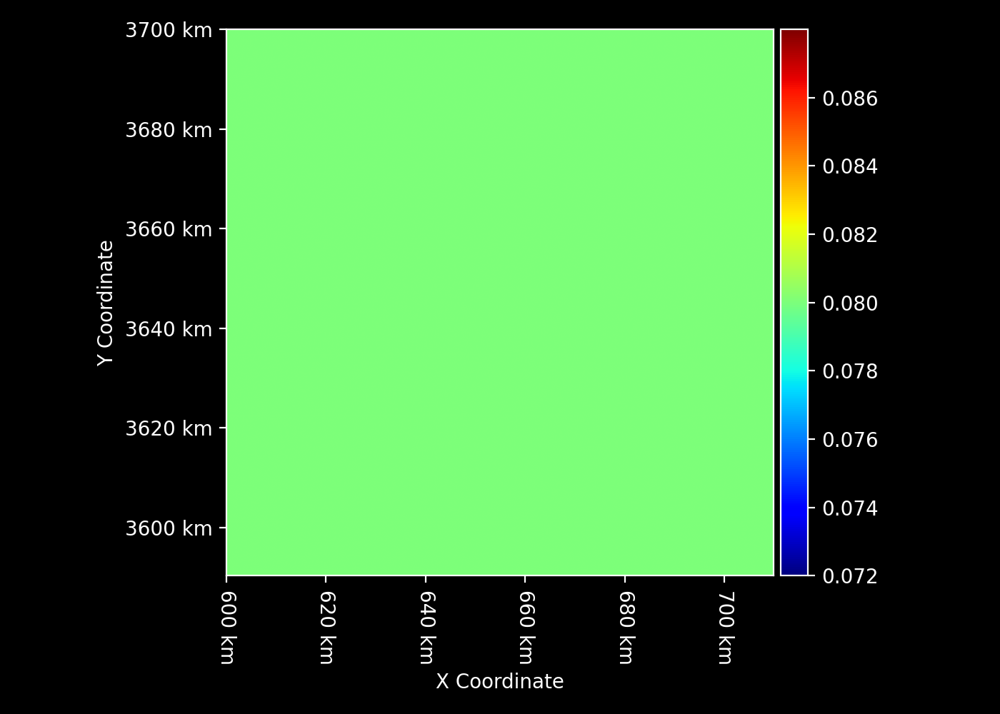

In [30]:
carbon_uptake_efficiency = load_carbon_uptake_efficiency(ST_C.geometry)
carbon_uptake_efficiency

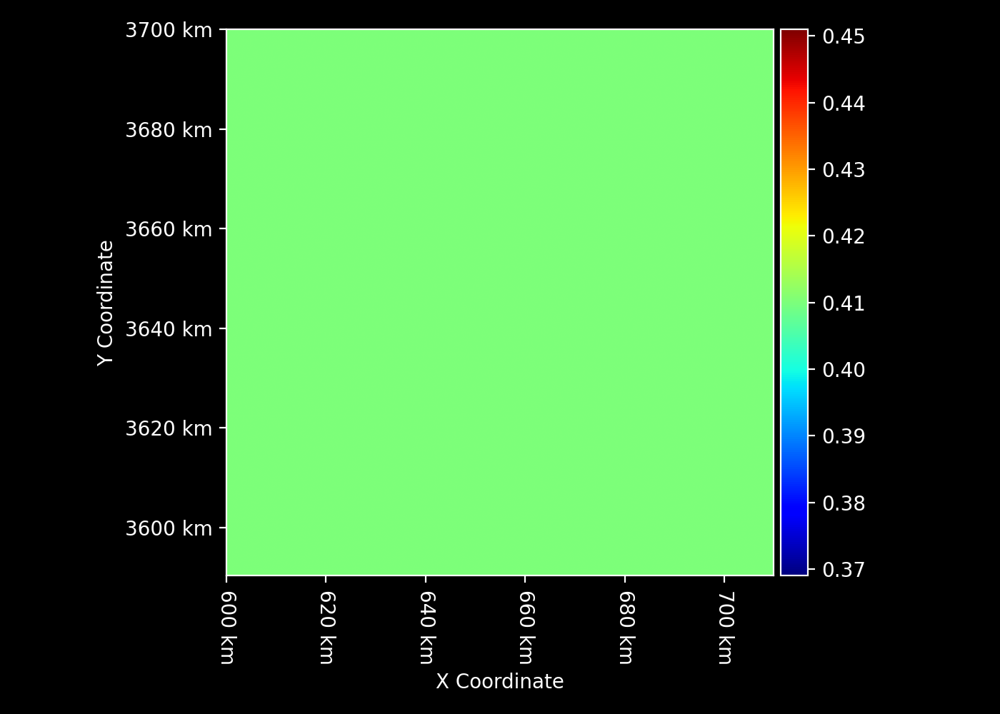

In [31]:
kn = load_kn(ST_C.geometry)
kn

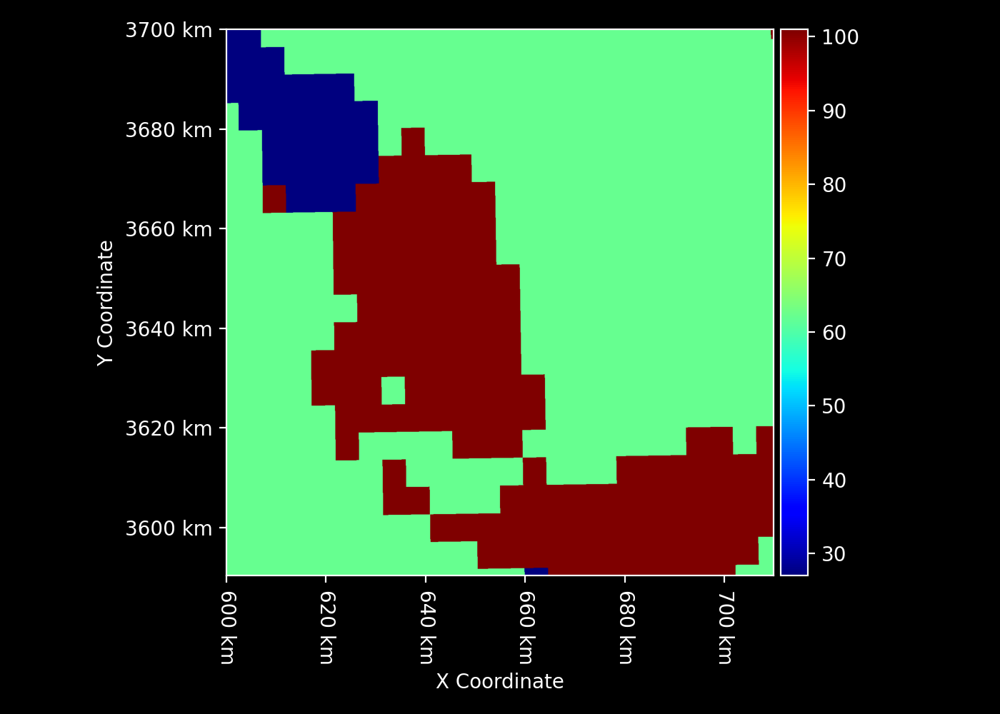

In [44]:
peakVCmax_C3 = load_peakVCmax_C3(ST_C.geometry)
peakVCmax_C3

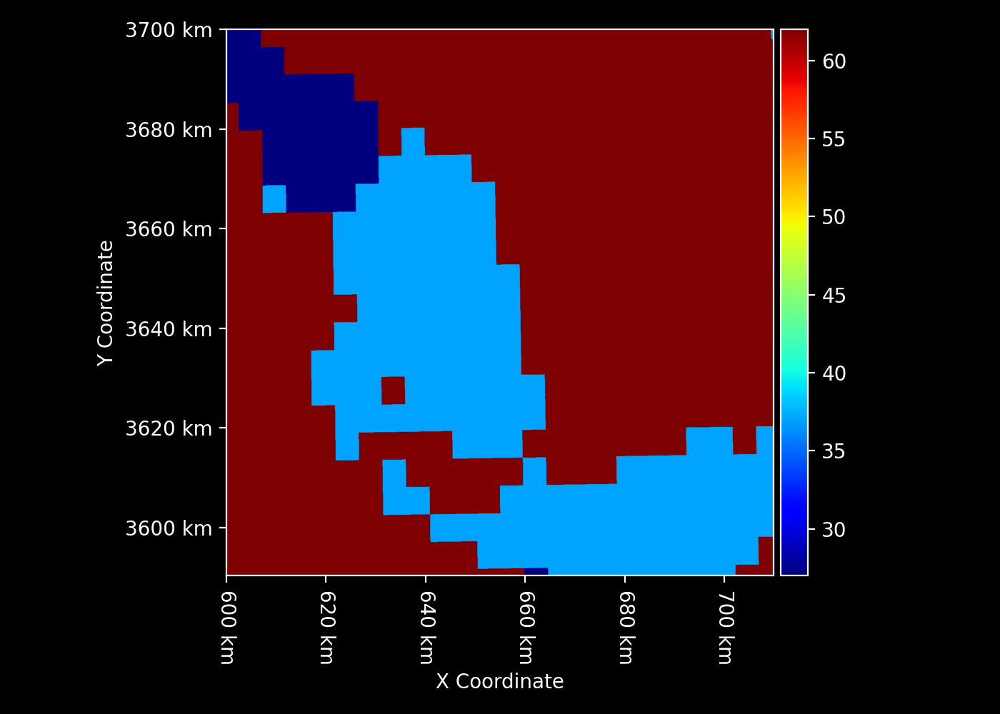

In [33]:
peakVCmax_C4 = load_peakVCmax_C4(ST_C.geometry)
peakVCmax_C4

--2025-03-10 17:31:48--  https://daac.ornl.gov/daacdata/global_vegetation/Global_Clumping_Index/data/global_clumping_index.tif
Resolving daac.ornl.gov (daac.ornl.gov)... 160.91.19.24
Connecting to daac.ornl.gov (daac.ornl.gov)|160.91.19.24|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://urs.earthdata.nasa.gov/oauth/authorize?app_type=401&client_id=QyeRbBJg8YuY_WBh-KBztA&response_type=code&redirect_uri=https%3A%2F%2Fdaac.ornl.gov%2Fdaacdata%2Fdoesntmater&state=aHR0cHM6Ly9kYWFjLm9ybmwuZ292L2RhYWNkYXRhL2dsb2JhbF92ZWdldGF0aW9uL0dsb2JhbF9DbHVtcGluZ19JbmRleC9kYXRhL2dsb2JhbF9jbHVtcGluZ19pbmRleC50aWY [following]
--2025-03-10 17:31:49--  https://urs.earthdata.nasa.gov/oauth/authorize?app_type=401&client_id=QyeRbBJg8YuY_WBh-KBztA&response_type=code&redirect_uri=https%3A%2F%2Fdaac.ornl.gov%2Fdaacdata%2Fdoesntmater&state=aHR0cHM6Ly9kYWFjLm9ybmwuZ292L2RhYWNkYXRhL2dsb2JhbF92ZWdldGF0aW9uL0dsb2JhbF9DbHVtcGluZ19JbmRleC9kYXRhL2dsb2JhbF9jbHVtcGluZ19pbmRleC50aWY
Reso

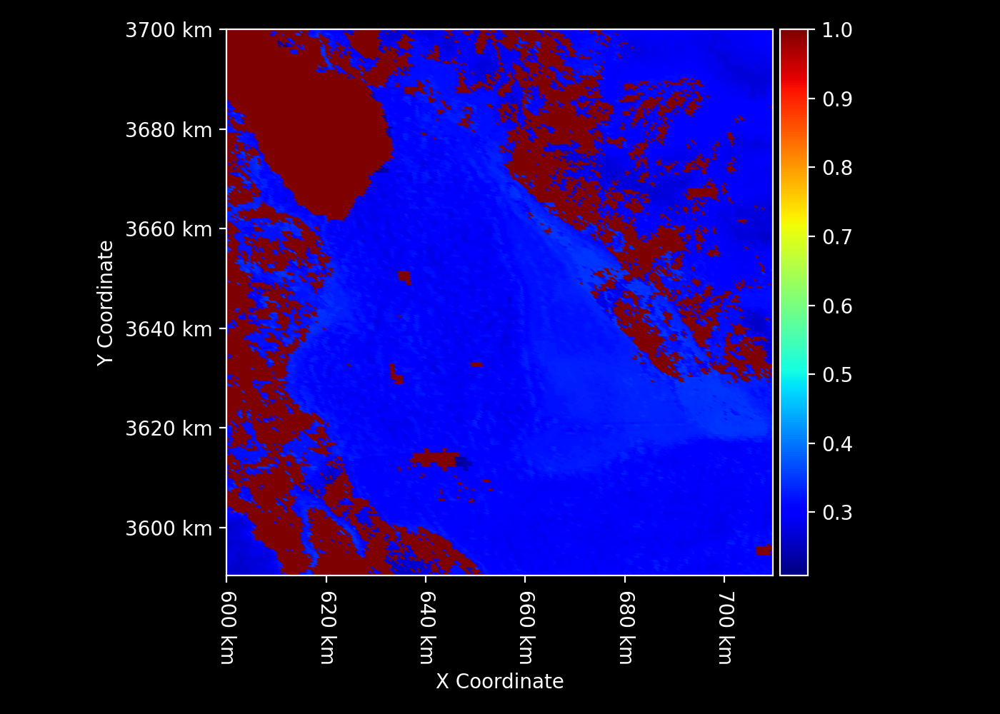

In [34]:
modisci = MODISCI()
CI = modisci.CI(ST_C.geometry)
CI

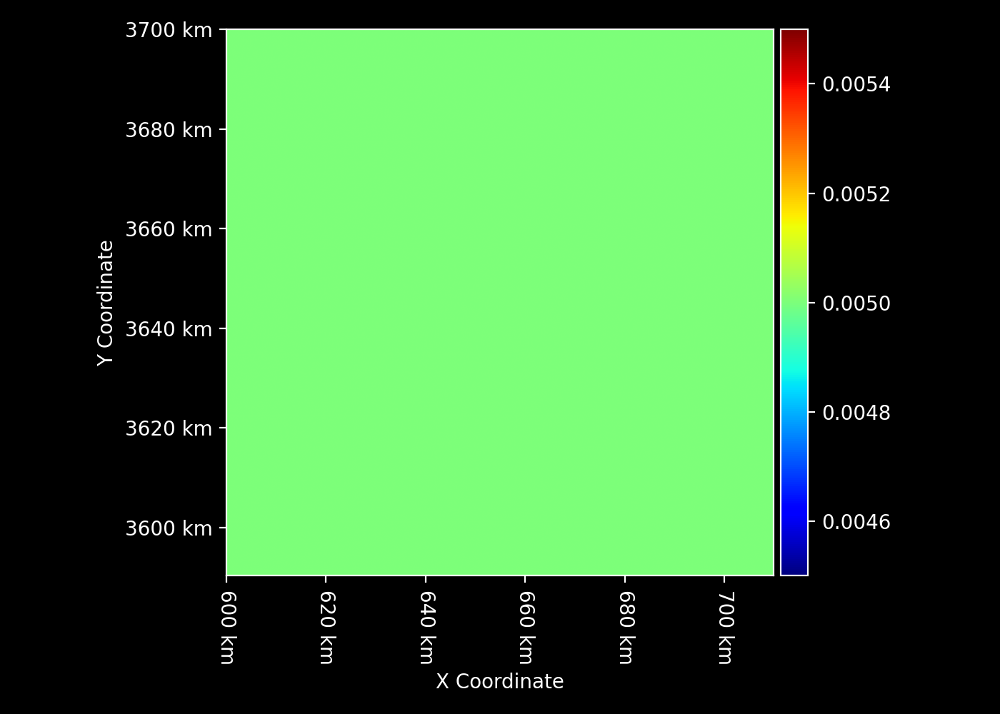

In [35]:
ball_berry_intercept_C3 = load_ball_berry_intercept_C3(ST_C.geometry)
ball_berry_intercept_C3

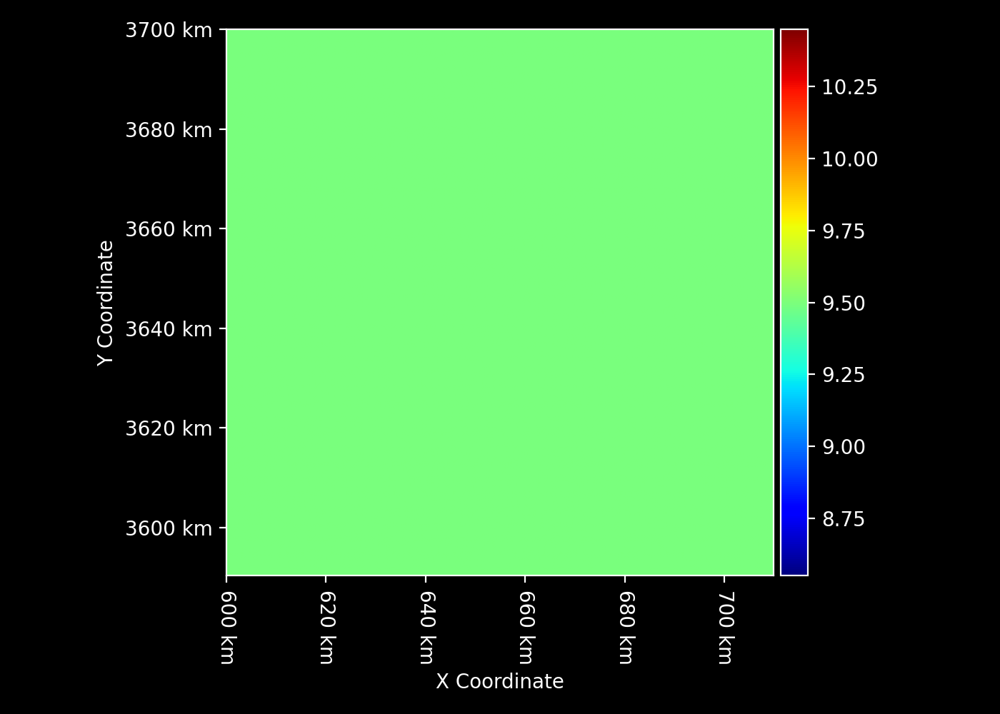

In [36]:
ball_berry_slope_C3 = load_ball_berry_slope_C3(ST_C.geometry)
ball_berry_slope_C3

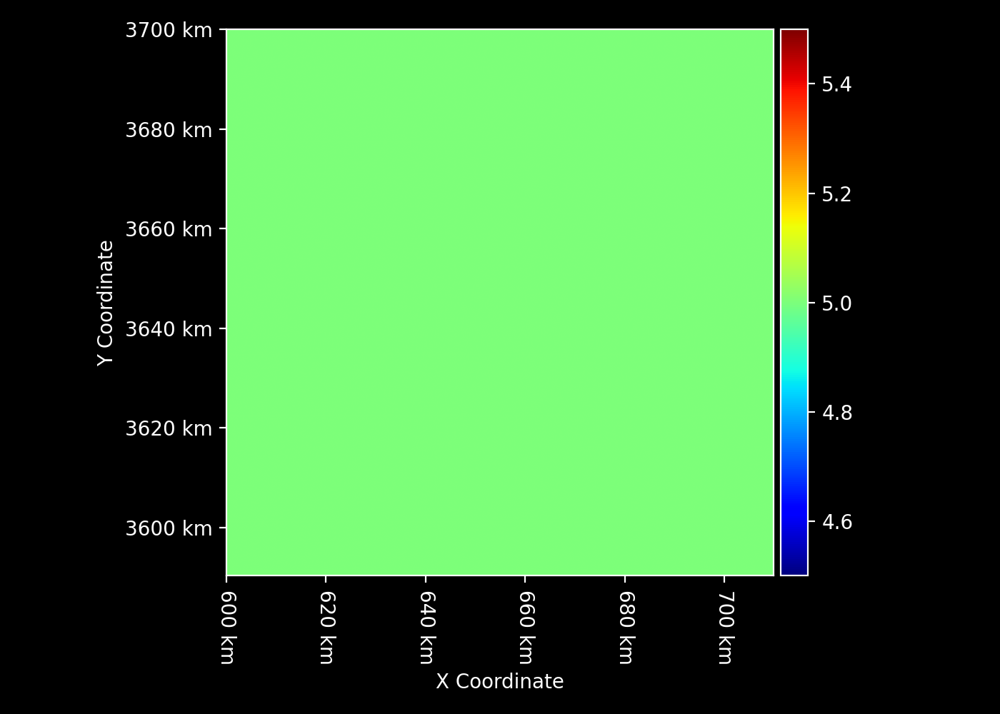

In [37]:
ball_berry_slope_C4 = load_ball_berry_slope_C4(ST_C.geometry)
ball_berry_slope_C4

In [38]:
%%capture
Ca = geos5fp.CO2SC(time_UTC=time_UTC, geometry=ST_C.geometry)

--2025-03-10 17:32:08--  https://portal.nccs.nasa.gov/datashare/gmao/geos-fp/das/Y2024/M07/D28/GEOS.fp.asm.tavg3_2d_chm_Nx.20240728_1930.V01.nc4
Resolving portal.nccs.nasa.gov (portal.nccs.nasa.gov)... 2001:4d0:2418:2800::a99a:9791, 169.154.151.145
Connecting to portal.nccs.nasa.gov (portal.nccs.nasa.gov)|2001:4d0:2418:2800::a99a:9791|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11043498 (11M) [application/octet-stream]
Saving to: ‘/Users/gregoryhalverson/data/GEOS5FP/GEOS5FP_download_directory/2024.07.28/GEOS.fp.asm.tavg3_2d_chm_Nx.20240728_1930.V01.nc4.20250311003208.download’

     0K .......... .......... .......... .......... ..........  0%  254K 42s
    50K .......... .......... .......... .......... ..........  0%  537K 31s
   100K .......... .......... .......... .......... ..........  1% 52.8K 88s
   150K .......... .......... .......... .......... ..........  1%  539K 70s
   200K .......... .......... .......... .......... ..........  2%  526K 60s

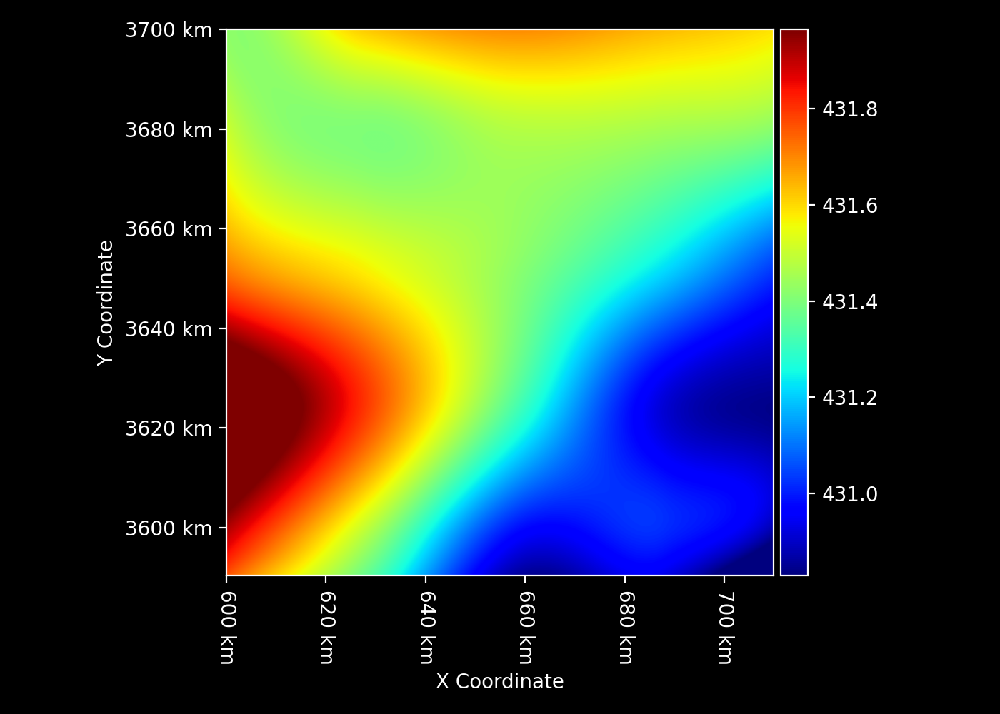

In [39]:
Ca

In [40]:
process_BESS_latlon?

Signature:
process_BESS_latlon(
    hour_of_day: numpy.ndarray,
    day_of_year: numpy.ndarray,
    latitude: numpy.ndarray,
    longitude: numpy.ndarray,
    elevation_km: numpy.ndarray,
    ST_K: numpy.ndarray,
    NDVI: numpy.ndarray,
    NDVI_minimum: numpy.ndarray,
    NDVI_maximum: numpy.ndarray,
    albedo: numpy.ndarray,
    Ta_K: numpy.ndarray,
    RH: numpy.ndarray,
    Rg: numpy.ndarray,
    VISdiff: numpy.ndarray,
    VISdir: numpy.ndarray,
    NIRdiff: numpy.ndarray,
    NIRdir: numpy.ndarray,
    UV: numpy.ndarray,
    canopy_height_meters: numpy.ndarray,
    Ca: numpy.ndarray,
    wind_speed_mps: numpy.ndarray,
    SZA: numpy.ndarray = None,
    canopy_temperature_K: numpy.ndarray = None,
    soil_temperature_K: numpy.ndarray = None,
    albedo_visible: numpy.ndarray = None,
    albedo_NIR: numpy.ndarray = None,
    C4_fraction: numpy.ndarray = None,
    carbon_uptake_efficiency: numpy.ndarray = None,
    kn: numpy.ndarray = None,
    ball_berry_intercept_C3: numpy.ndarr

In [41]:
BESS_results = process_BESS_latlon(
    hour_of_day=hour_of_day_solar,
    day_of_year=doy_solar,
    latitude=latitude,
    longitude=longitude,
    elevation_km=elevation_km,
    ST_C=ST_C,
    NDVI=NDVI,
    NDVI_minimum=NDVI_minimum,
    NDVI_maximum=NDVI_maximum,
    albedo=albedo,
    Ta_C=Ta_C,
    RH=RH,
    Rg=Rg,
    VISdiff=VISdiff,
    VISdir=VISdir,
    NIRdiff=NIRdiff,
    NIRdir=NIRdir,
    UV=UV,
    canopy_height_meters=canopy_height_meters,
    Ca=400,
    wind_speed_mps=wind_speed_mps,
    SZA=SZA_deg,
    canopy_temperature_C=ST_C,
    soil_temperature_C=ST_C,
    albedo_visible=albedo,
    albedo_NIR=albedo,
    C4_fraction=C4_fraction,
    carbon_uptake_efficiency=carbon_uptake_efficiency,
    kn=kn,
    ball_berry_intercept_C3=ball_berry_intercept_C3,
    ball_berry_intercept_C4=BALL_BERRY_INTERCEPT_C4,
    ball_berry_slope_C3=ball_berry_slope_C3,
    ball_berry_slope_C4=ball_berry_slope_C4,
    peakVCmax_C3=peakVCmax_C3,
    peakVCmax_C4=peakVCmax_C4,
    CI=CI
)

TypeError: process_BESS_latlon() got an unexpected keyword argument 'ST_C'

In [ ]:
BESS_results["GPP"]

In [ ]:
BESS_results["Rn"]

In [ ]:
BESS_results["LE"]